## Notebook containing code used for manuscript supplementary figure 2

## Packages

In [2]:
import warnings
import anndata as ad
import spateo as st
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(context="paper", style="ticks", font_scale=1)
warnings.filterwarnings('ignore')

## Load E95 data objects

In [3]:
available_cts_E95= {
    "Amniotic ectoderm": "Amniotic ectoderm",
    "Anterior floor plate": "Anterior floor plate",
    "Anterior intermediate mesoderm": "Anterior intermediate mesoderm",
    "Anterior roof plate": "Anterior roof plate",
    "Arterial endothelial cells": "Arterial endothelial cells",
    "Cardiopharyngeal mesoderm": "Cardiopharyngeal mesoderm",
    "Cranial mesoderm": "Sclerotome",
    "Cranial motor neurons": "Cranial motor neurons",
    "Dermomyotome": "Dermomyotome",
    "Diencephalon neuroectoderm": "Diencephalon",
    "Dorsal telencephalon neuroectoderm": "Dorsal telencephalon",
    "Ectoderm-derived": "Placodal area",
    "Endocardial cells": "Endocardial cells",
    "Endothelium": "Endothelium",
    "Epithelial precursors": "Pre-epidermal keratinocytes",
    "Glutamatergic neurons": "Glutamatergic neurons",
    "Gut": "Gut",
    "Gut mesenchyme": "Gut mesenchyme",
    "Head and facial mesenchyme": "Facial mesenchyme",
    "Hematoendothelial progenitors": "Hematoendothelial progenitors",
    "Hepatic mesenchyme": "Hepatic mesenchyme",
    "Hepatocytes": "Hepatocytes",
    "Hindbrain neuroectoderm": "Hindbrain",
    "Hypothalamus neuroectoderm": "Hypothalamus",
    "Hypothalamus (Sim1+) neuroectoderm": "Hypothalamus (Sim1+)",
    "Intermediate mesoderm": "Posterior intermediate mesoderm",
    "Lateral plate mesoderm": "Lateral plate and intermediate mesoderm",
    "Limb progenitors and lateral plate mesoderm": "Limb mesenchyme progenitors",
    "Liver sinusoidal endothelial cell precursors": "Endothelium",
    "LV/atrioventricular canal/common atrium cardiomyocytes": "First heart field",
    "Mesodermal progenitors": "Mesodermal progenitors (Tbx6+)",
    "Midbrain neuroectoderm": "Midbrain",
    "Midbrain-hindbrain boundary": "Midbrain-hindbrain boundary",
    "Neural crest (PNS glia)": "Neural crest (PNS glia)",
    "Neural crest (PNS neurons)": "Neural crest (PNS neurons)",
    "Neural progenitor cells": "Neural progenitor cells (Neurod1+)",
    "Neuroectoderm-derived": "Neural progenitor cells (Neurod1+)",
    "NMPs and spinal cord progenitors": "NMPs and spinal cord progenitors",
    "Olfactory epithelial cells": "Olfactory epithelial cells",
    "Otic epithelial cells": "Otic epithelial cells",
    "Placode and neural crest-derived": "Placodal area",
    "Posterior roof plate": "Posterior roof plate",
    "Primitive erythroid cells": "Primitive erythroid cells",
    "Proepicardium": "Proepicardium",
    "Renal mesenchyme": "Renal pericytes and mesangial cells",
    "Sclerotome": "Sclerotome",
    "Second heart field-derived cardiomyocytes": "Second heart field",
    "Spinal cord dorsal progenitors": "Spinal cord dorsal progenitors",
    "Spinal cord motor neurons": "Spinal cord motor neurons",
    "Spinal cord neuroectoderm": "Spinal cord/r7/r8",
    "Spinal cord ventral progenitors": "Spinal cord ventral progenitors",
    "Telencephalon neuroectoderm": "Telencephalon",
    "Vessel endothelial cells": "Brain capillary endothelial cells"
}
available_cts_colors_E95 = {"Sclerotome": "#2DA048", "Dermomyotome": "#C49C94", "Lateral plate mesoderm": "#1F77B4", "Limb progenitors and lateral plate mesoderm": "#A1C299", "Head and facial mesenchyme": "#F57E20", "Cranial mesoderm": "#9268AC", "Gut mesenchyme": "#8C574C", "Cardiopharyngeal mesoderm": "#DBDB8C", "Renal mesenchyme": "#1DBFCF", "Mesodermal progenitors": "#4C64AE", "Hepatic mesenchyme": "#FF00FF", "Intermediate mesoderm": "#E5E4E2", "Anterior intermediate mesoderm": "#FCB415", "Primitive erythroid cells": "#FCBA78", "Hematoendothelial progenitors": "#456D75", "Endothelium": "#FFDAB9", "Arterial endothelial cells": "#F8A993", "Liver sinusoidal endothelial cell precursors": "#CAE8E1", "Vessel endothelial cells": "#0E1033", "Epithelial precursors": "#AEC7E8", "Placode and neural crest-derived": "#F69696", "Gut": "#4B3B53", "Otic epithelial cells": "#003349", "Olfactory epithelial cells": "#CC1F47", "Amniotic ectoderm": "#352411", "Hepatocytes": "#0C2013", "Ectoderm-derived": "#C7DF92", "Glutamatergic neurons": "#D06327", "Spinal cord motor neurons": "#05A6D8", "Cranial motor neurons": "#A079B6", "Neural progenitor cells": "#A93493", "Spinal cord ventral progenitors": "#E0C4DE", "Spinal cord dorsal progenitors": "#798D66", "Telencephalon neuroectoderm": "#F6B5D1", "Spinal cord neuroectoderm": "#9ED089", "Midbrain neuroectoderm": "#7F7F7F", "Hindbrain neuroectoderm": "#C4B0D5", "Midbrain-hindbrain boundary": "#C7C7C6", "Diencephalon neuroectoderm": "#7B504B", "Hypothalamus neuroectoderm": "#DEEEFA", "Hypothalamus (Sim1+) neuroectoderm": "#038470", "Dorsal telencephalon neuroectoderm": "#124B99", "Neuroectoderm-derived": "#BCBD32", "Anterior floor plate": "#C0B9B2", "Anterior roof plate": "#2B0F1B", "Posterior roof plate": "#6C2062", "Eye field": "#62615A", "NMPs and spinal cord progenitors": "#EE3780", "Neural crest (PNS glia)": "#9FDAE5", "Neural crest (PNS neurons)": "#6B7A34", "LV/atrioventricular canal/common atrium cardiomyocytes": "#FF0000", "Second heart field-derived cardiomyocytes": "#F08080", "Proepicardium": "#FFA07A", "Endocardial cells": "#FF6347"}

In [4]:
E95_adata = ad.read(f"/media/pc001/Yao/Projects/Project_spateo/mouse_embryo/h5ad/mouse_E9.5_st_final.h5ad")
E95_adata.X = None
E95_adata = E95_adata[E95_adata.obs['mapped_celltype'].isin([ct for ct in available_cts_E95.keys()])]
E95_adata.obs['sc_ref_cts'] = E95_adata.obs['mapped_celltype'].map(lambda x: available_cts_E95[str(x)])

sc_cell_data = pd.read_csv(f"/media/pc001/Yao/Projects/Project_spateo/mouse_embryo/E9.5_sc_image/mouse_E9.5_sc_final_cells_data.csv", index_col=0, sep="\t")
sc_cell_cts = pd.DataFrame(sc_cell_data.loc[:, ['major_trajectory', 'celltype_Spateo_match']])
sc_cell_cts.drop_duplicates(keep='first', inplace=True)
sc_groups = {sc_cell_cts.loc[i, 'celltype_Spateo_match']: sc_cell_cts.loc[i, 'major_trajectory'] for i in sc_cell_cts.index}
E95_adata.obs['sc_ref_groups'] = E95_adata.obs['sc_ref_cts'].map(lambda x: sc_groups[str(x)])

E95_pc, _ = st.tdr.construct_pc(adata=E95_adata, spatial_key='spatial',groupby='mapped_celltype',key_added='mapped_celltype', colormap=available_cts_colors_E95)
E95_mesh = st.tdr.read_model(f"/media/pc001/Yao/Projects/Project_spateo/mouse_embryo/Mouse_E95/mesh_models/0_Embryo_mouse_E95_mesh_model.vtk")
E95_adata

AnnData object with n_obs × n_vars = 884114 × 14508
    obs: 'area', 'louvain', 'cellbin_SpatialDomain', 'mapped_celltype', 'n_genes_by_counts', 'total_counts', 'sc_ref_cts', 'sc_ref_groups'
    var: 'n_cells_by_counts', 'total_counts'
    obsm: 'spatial'

## Figure S2a- 3D spatial distribution of all identified cell types at E9.5

In [5]:
E95_cell_groups = ['CNS_neurons', 'Endothelium', 'Mesoderm', 'Neuroectoderm_and_glia', 'Epithelial_cells', 'Primitive_erythroid', 'Neural_crest_PNS_glia', 'Neural_crest_PNS_neurons', 'Cardiomyocytes', 'Hepatocytes']

E95_st_cell_data = pd.DataFrame(E95_adata.obs[['mapped_celltype', 'sc_ref_groups']])
E95_st_cell_data.drop_duplicates(keep='first', inplace=True)
for cg in E95_cell_groups:
    sub_st_cell_data = E95_st_cell_data.loc[E95_st_cell_data['sc_ref_groups'].isin([cg])]
    print(f'{cg}: {sub_st_cell_data.shape[0]} cell types')

CNS_neurons: 7 cell types
Endothelium: 6 cell types
Mesoderm: 12 cell types
Neuroectoderm_and_glia: 13 cell types
Epithelial_cells: 9 cell types
Primitive_erythroid: 1 cell types
Neural_crest_PNS_glia: 1 cell types
Neural_crest_PNS_neurons: 1 cell types
Cardiomyocytes: 2 cell types
Hepatocytes: 1 cell types


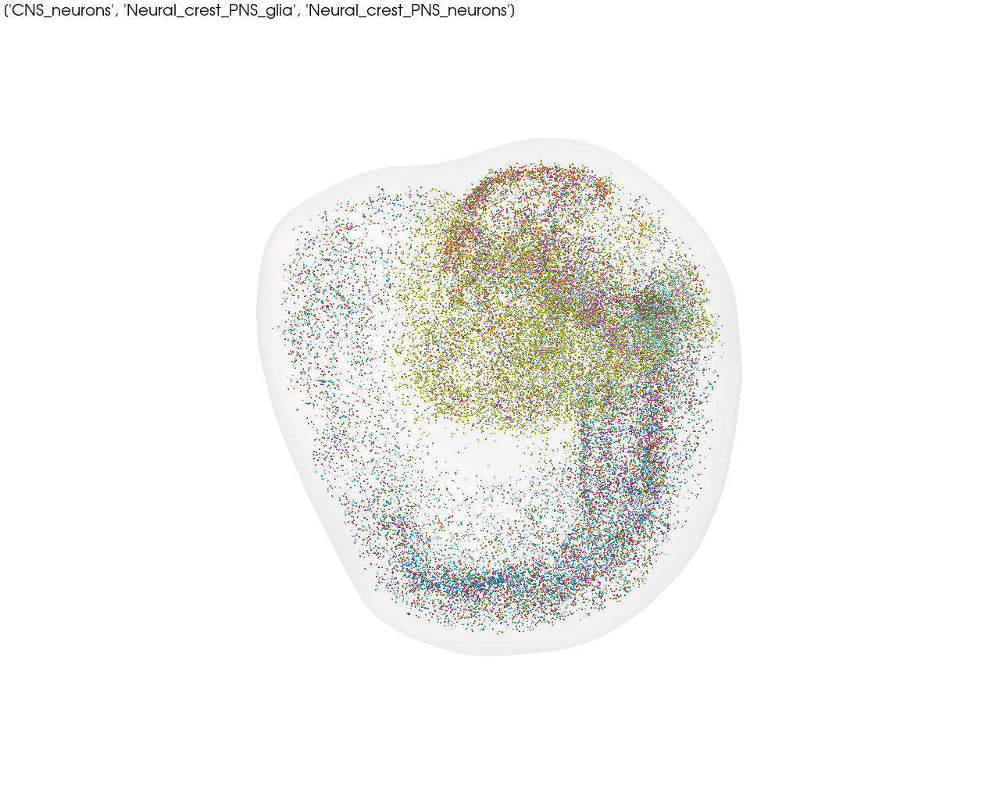

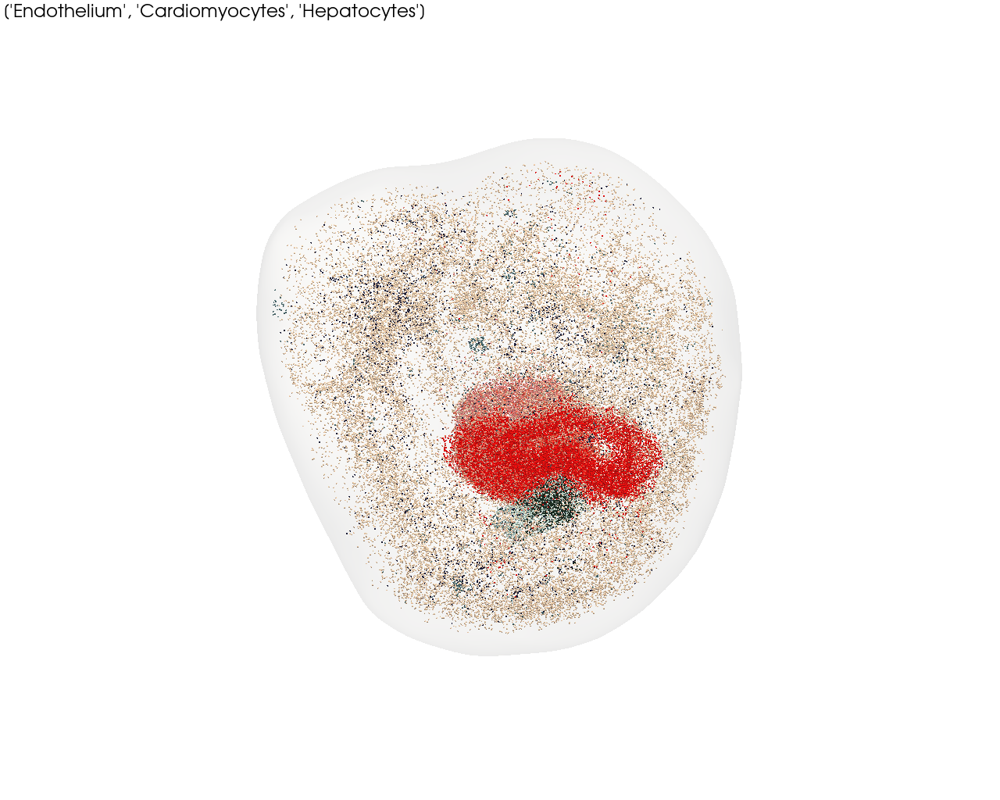

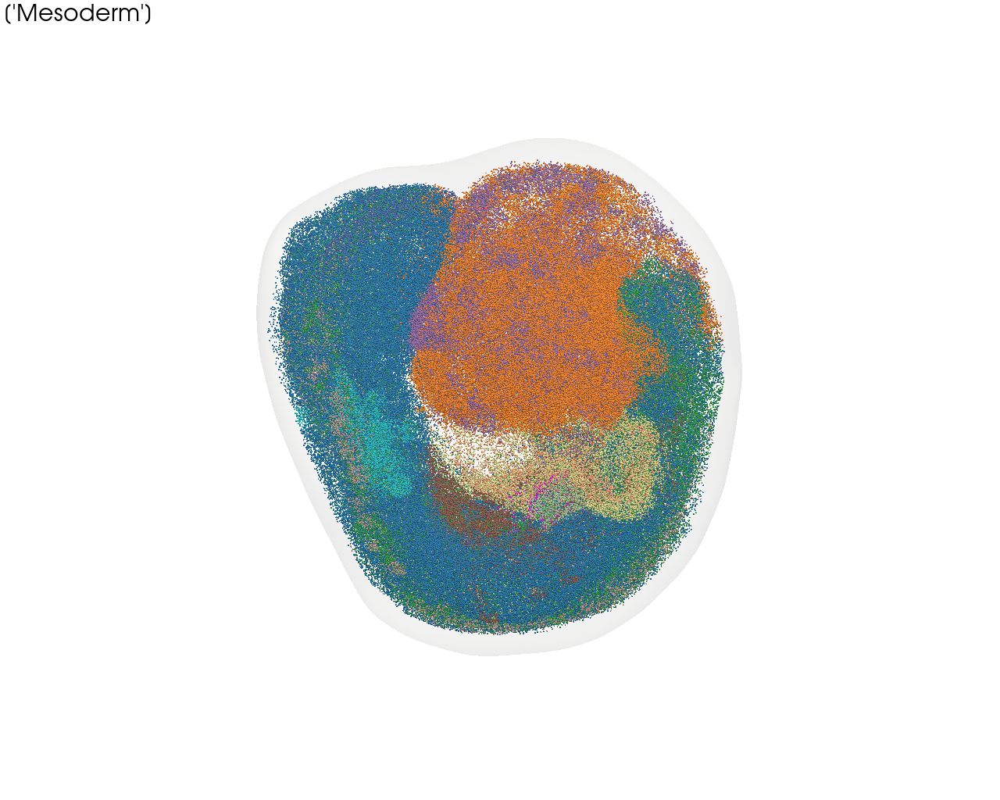

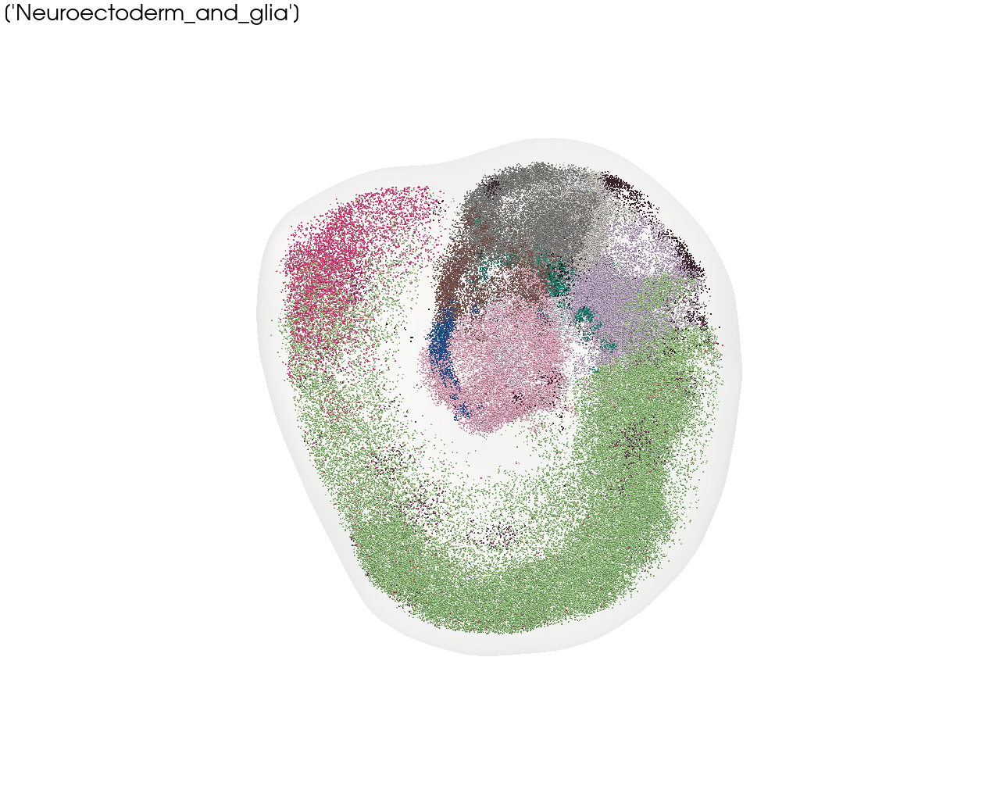

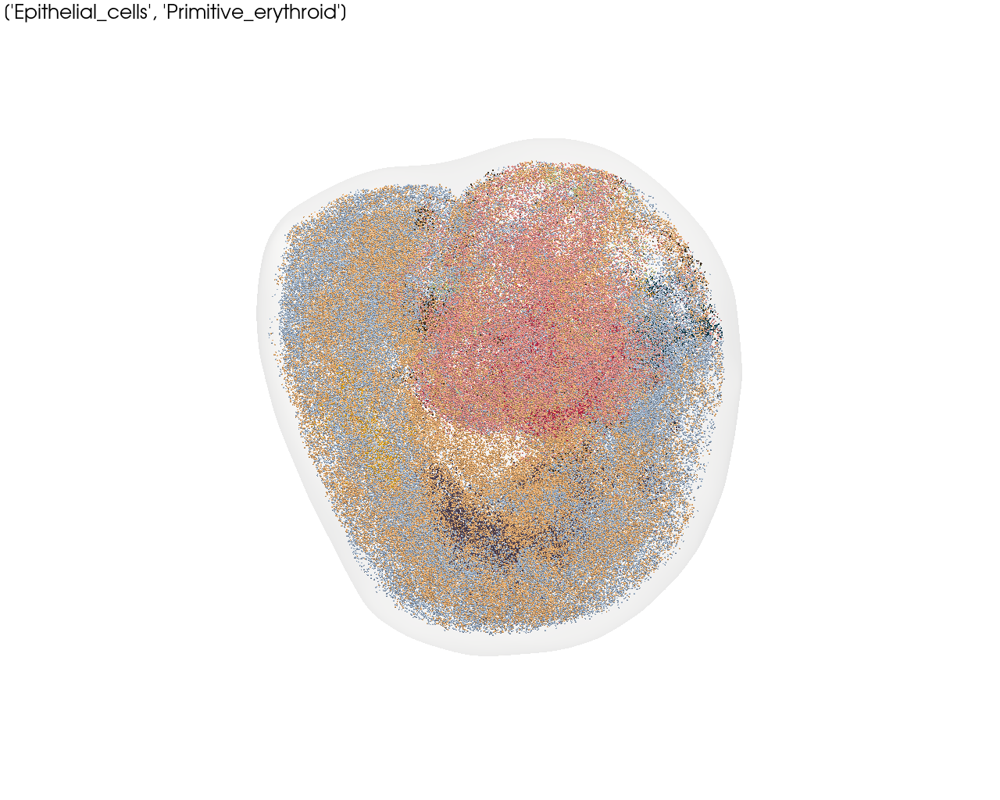

In [6]:
E95_cgs_dict = {
    'sub1': ['CNS_neurons', 'Neural_crest_PNS_glia', 'Neural_crest_PNS_neurons'],
    'sub2': ['Endothelium', 'Cardiomyocytes', 'Hepatocytes'],
    'sub3': ['Mesoderm'],
    'sub4': ['Neuroectoderm_and_glia'],
    'sub5': ['Epithelial_cells', 'Primitive_erythroid'],
}
for key, sub_groups in E95_cgs_dict.items():
    sub_E95_st_cell_data = E95_st_cell_data.loc[E95_st_cell_data['sc_ref_groups'].isin(sub_groups)]
    sub_E95_pc = E95_pc.extract_points(np.isin(np.asarray(E95_pc.point_data['mapped_celltype']), sub_E95_st_cell_data['mapped_celltype'].tolist()))
    
    import pyvista as pv
    pv.global_theme.transparent_background = False
    _ = st.pl.three_d_plot(
            model=st.tdr.collect_models([sub_E95_pc, E95_mesh]),
            key='mapped_celltype',
            model_style=["points", "surface"],
            model_size=2,
            opacity=[1, 0.3],
            colormap=None,
            text=f'{sub_groups}',
            show_legend=False,
            show_axes=False,
            jupyter="static",
            cpo="xy",
            window_size=(1280, 1024),
        )

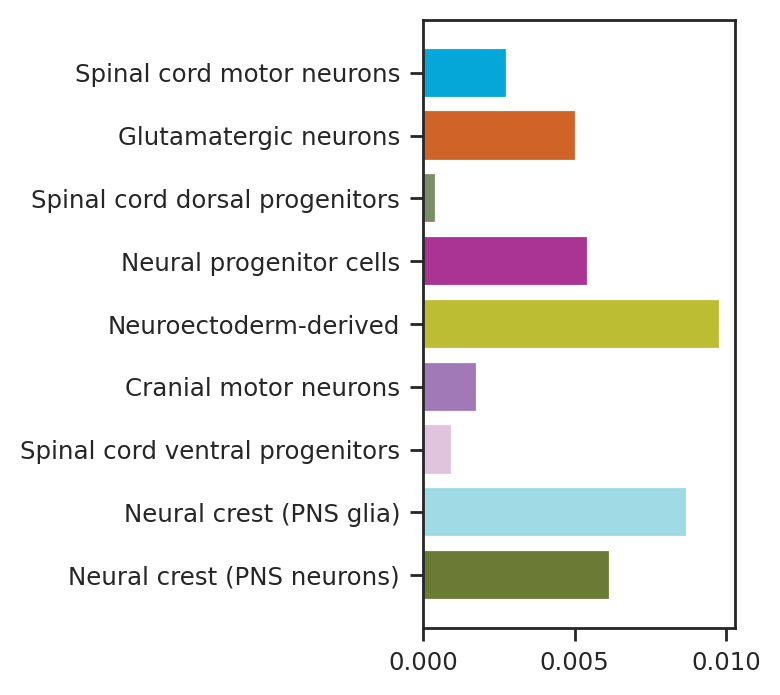

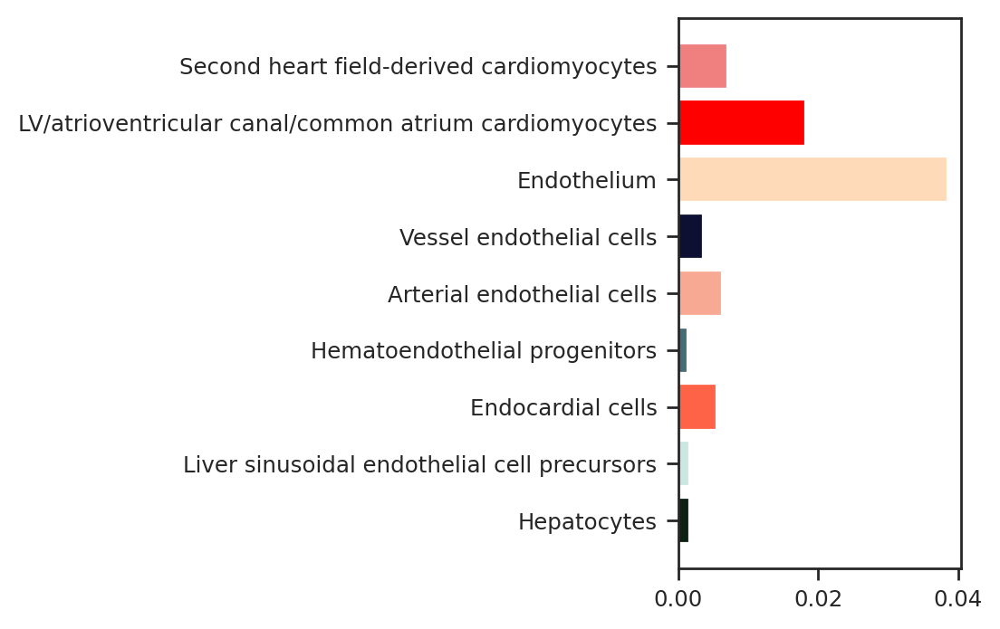

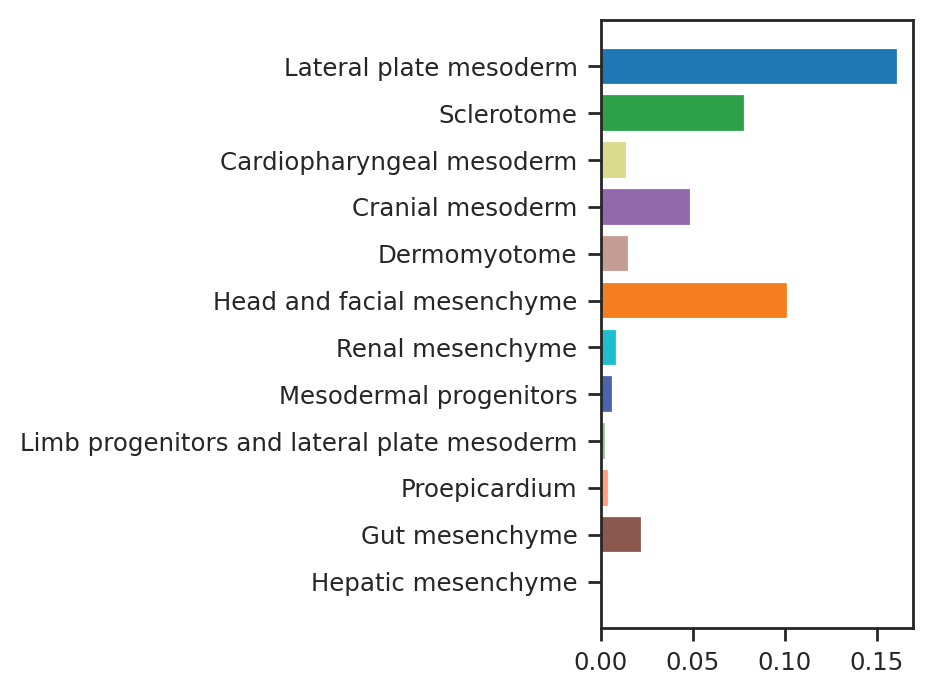

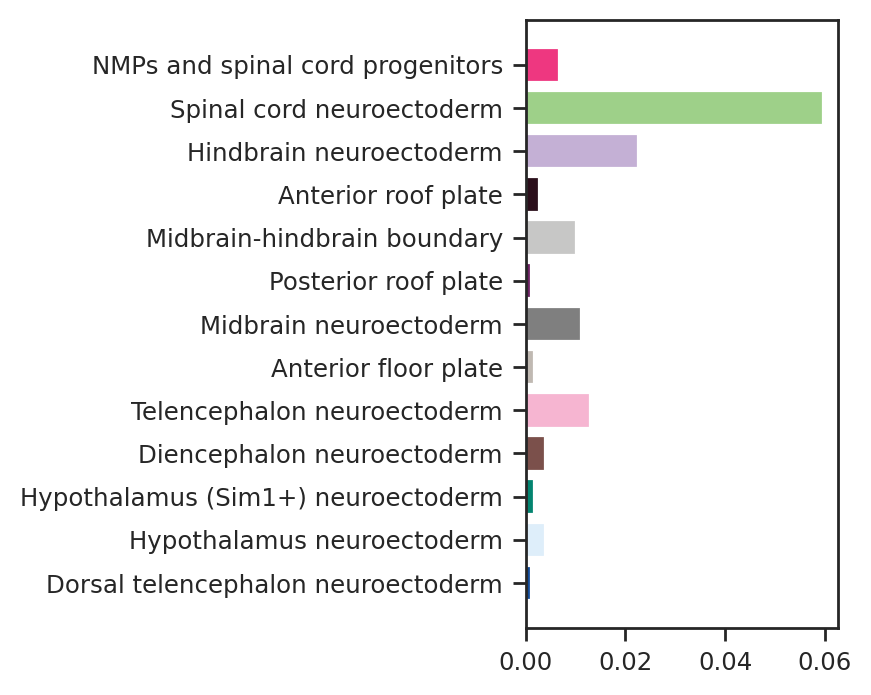

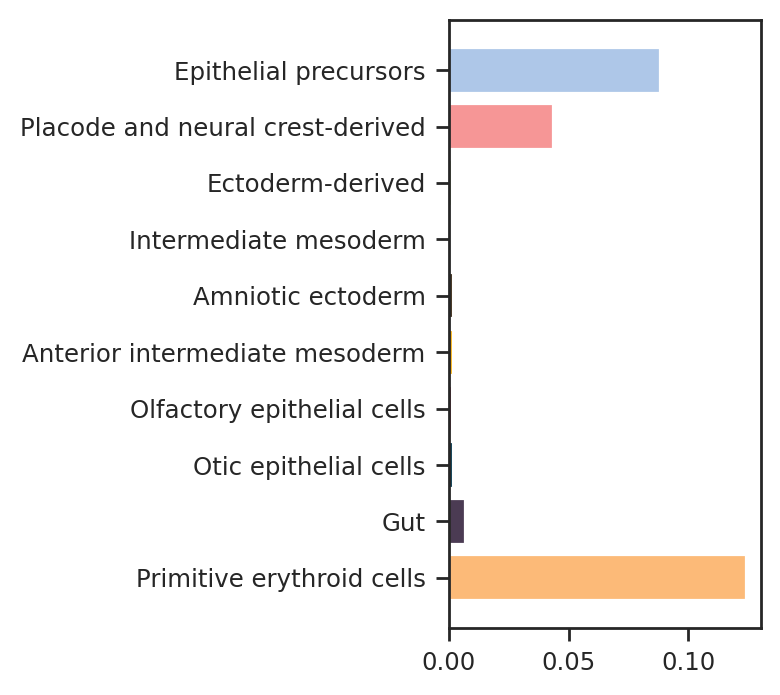

In [7]:
for key, sub_groups in E95_cgs_dict.items():
    sub_st_cell_data = E95_st_cell_data.loc[E95_st_cell_data['sc_ref_groups'].isin(sub_groups)]
    sub_st_cell_data.sort_values(by=['sc_ref_groups'], inplace=True)
    sub_st_celltypes = sub_st_cell_data['mapped_celltype'].tolist()
    sub_st_celltypes.reverse()
    
    sub_adata = E95_adata[E95_adata.obs['mapped_celltype'].isin(sub_st_celltypes), :].copy()
    sub_data = pd.DataFrame(sub_adata.obs['mapped_celltype'].value_counts() / E95_adata.shape[0]).loc[sub_st_celltypes, :]
    sub_data.columns = ["fraction"]
    sub_data["celltypes"] = sub_data.index
    
    fig, ax = plt.subplots(1, 1, figsize=(2, 4))
    ax.barh(sub_data["celltypes"], sub_data["fraction"], label=sub_data["celltypes"], color=[available_cts_colors_E95[ct] for ct in sub_data["celltypes"]])
    fig.show()

## Load E115 data objects

In [8]:
available_cts_E115 = {
    "Anterior floor plate": "Anterior floor plate",
    "Anterior roof plate": "Anterior roof plate",
    "Apical ectodermal ridge": "Apical ectodermal ridge",
    "Arterial endothelial cells": "Arterial endothelial cells",
    "Astrocytes": "Astrocytes",
    "Atrial cardiomyocytes": "First heart field",
    "Border-associated macrophages": "Border-associated macrophages",
    "Branchial arch epithelium": "Branchial arch epithelium",
    "CNS capillary endothelial cells": "Brain capillary endothelial cells",
    "Cajal-Retzius cells": "Cajal-Retzius cells",
    "Cardiac fibroblasts": "Fibroblasts",
    "Cardiac mesoderm": "Cardiopharyngeal mesoderm",
    "Chondrocytes": "Chondrocytes (Atp1a2+)",
    "Choroid plexus epithelial precursors": "Choroid plexus",
    "Cranial mesoderm": "Sclerotome",
    "Cranial motor neurons": "Cranial motor neurons",
    "Definitive early erythroblasts": "Definitive early erythroblasts (CD36-)",
    "Dermatome": "Dermatome",
    "Dermomyotome": "Dermomyotome",
    "Diencephalon neuroectoderm": "Diencephalon",
    "Dorsal telencephalon neuroectoderm": "Dorsal telencephalon",
    "Early chondrocytes": "Early chondrocytes",
    "Ectoderm-derived": "Placodal area",
    "Endocardial cells": "Endocardial cells",
    "Endothelium": "Endothelium",
    "Enteric neurons": "Enteric neurons",
    "Epithelial precursors": "Pre-epidermal keratinocytes",
    "Eye field": "Eye field",
    "Facial mesenchyme": "Facial mesenchyme",
    "Fibroblasts": "Fibroblasts",
    "Floorplate and p3 domain": "Floorplate and p3 domain",
    "GABAergic interneurons": "GABAergic cortical interneurons",
    "GABAergic neurons": "GABAergic neurons",
    "Glutamatergic neurons": "Glutamatergic neurons",
    "Gut": "Gut",
    "Gut mesenchyme": "Gut mesenchyme",
    "Hematopoietic progenitors": "Hematopoietic stem cells (Cd34+)",
    "Hepatic mesenchyme": "Hepatic mesenchyme",
    "Hepatocytes": "Hepatocytes",
    "Hindbrain neuroectoderm": "Hindbrain",
    "Hypothalamus (Sim1+) neuroectoderm": "Hypothalamus (Sim1+)",
    "Hypothalamus neuroectoderm": "Hypothalamus",
    "Intermediate neuronal progenitors": "Intermediate neuronal progenitors",
    "Kupffer cells": "Kupffer cells",
    "Lateral plate and intermediate mesoderm": "Splanchnic mesoderm",
    "Limb progenitors and lateral plate mesenchyme": "Limb mesenchyme progenitors",
    "Liver sinusoidal endothelial cells": "Liver sinusoidal endothelial cells",
    "Lung mesenchyme": "Lung mesenchyme",
    "Lung progenitor cells": "Lung progenitor cells",
    "Lymphatic vessel endothelial cells": "Lymphatic vessel endothelial cells",
    "Megakaryocytes": "Megakaryocytes",
    "Mesoderm-derived": "Somatic mesoderm",
    "Mesodermal progenitors": "Mesodermal progenitors (Tbx6+)",
    "Metanephric mesenchyme": "Metanephric mesenchyme",
    "Microglia": "Microglia",
    "Midbrain neuroectoderm": "Midbrain",
    "Midbrain-hindbrain boundary": "Midbrain-hindbrain boundary",
    "Muscle progenitor cells": "Muscle progenitor cells",
    "Myelinating Schwann cells": "Myelinating Schwann cells",
    "Myoblasts": "Myoblasts",
    "Myofibroblasts": "Myofibroblasts",
    "Myotubes": "Myotubes",
    "NMPs and spinal cord progenitors": "NMPs and spinal cord progenitors",
    "Neural crest (PNS glia)": "Neural crest (PNS glia)",
    "Neural crest (PNS neurons)": "Neural crest (PNS neurons)",
    "Neural progenitors": "Neural progenitor cells (Neurod1+)",
    "Neuroectoderm-derived": "Telencephalon",
    "Olfactory epithelial cells": "Olfactory epithelial cells",
    "Otic epithelial cells": "Otic epithelial cells",
    "Otic sensory neurons": "Otic sensory neurons",
    "Outflow tract cardiomyocytes": "First heart field",
    "Pituitary and Pineal gland progenitors": "Pituitary/Pineal gland progenitors",
    "Placode and neural crest-derived": "Placodal area",
    "Posterior roof plate": "Posterior roof plate",
    "Primitive erythroid cells": "Primitive erythroid cells",
    "Proepicardium": "Proepicardium",
    "Renal mesenchyme": "Metanephric mesenchyme",
    "Sclerotome": "Sclerotome",
    "Skeletal muscle progenitors": "Muscle progenitor cells (Prdm1+)",
    "Somitic muscle progenitors": "Muscle progenitor cells (Prdm1+)",
    "Spinal V0/1 interneurons": "Spinal V0 interneurons",
    "Spinal V2/3 interneurons": "Spinal V2a interneurons",
    "Spinal cord dorsal progenitors": "Spinal cord dorsal progenitors",
    "Spinal cord motor neurons": "Spinal cord motor neurons",
    "Spinal cord neuroectoderm": "Spinal cord/r7/r8",
    "Spinal cord ventral progenitors": "Spinal cord ventral progenitors",
    "Spinal dI1 interneurons": "Spinal dI1 interneurons",
    "Spinal dI2/3/4 interneurons": "Spinal dI2 interneurons",
    "Spinal dI5/6 interneurons": "Spinal dI5 interneurons",
    "Sympathetic neurons": "Sympathetic neurons",
    "Telencephalon neuroectoderm": "Telencephalon",
    "Ureteric bud": "Ureteric bud",
    "Ventricular cardiomyocytes": "First heart field",
    "Zona limitans intrathalamica": "Thalamic neuronal precursors"
}
available_cts_colors_E115 = {"Sclerotome": "#1F77B4", "Facial mesenchyme": "#9268AC", "Lateral plate and intermediate mesoderm": "#C4B0D5", "Limb progenitors and lateral plate mesenchyme": "#C49C94", "Fibroblasts": "#F69696", "Chondrocytes": "#DBDB8C", "Early chondrocytes": "#D52928", "Dermomyotome": "#4B3B53", "Dermatome": "#4C64AE", "Cranial mesoderm": "#FCBA78", "Cranial mesenchyme": "#8C574C", "Mesenchymal progenitors": "#D879B1", "Mesoderm-derived": "#0E1033", "Gut mesenchyme": "#F8A993", "Renal mesenchyme": "#A93493", "Lung mesenchyme": "#6C2062", "Metanephric mesenchyme": "#885678", "Hepatic mesenchyme": "#D058A0", "Definitive early erythroblasts": "#6B7A34", "Primitive erythroid cells": "#7F7F7F", "Border-associated macrophages": "#2CB565", "Hematopoietic progenitors": "#F4899A", "Microglia": "#72428F", "Kupffer cells": "#A6772B", "Endothelium": "#FFDAB9", "CNS capillary endothelial cells": "#FCB415", "Arterial endothelial cells": "#F391BC", "Liver sinusoidal endothelial cells": "#6BBE45", "Lymphatic vessel endothelial cells": "#003349", "Epithelial precursors": "#AEC7E8", "Olfactory epithelial cells": "#038470", "Otic epithelial cells": "#646375", "Choroid plexus epithelial cells": "#C8A1A1", "Apical ectodermal ridge": "#456D75", "Gut": "#DEEEFA", "Lung progenitor cells": "#B77B68", "Hepatocytes": "#2DBA9C", "Placode and neural crest-derived": "#00A6AA", "Branchial arch epithelium": "#D06327", "Ureteric bud": "#124B99", "Pituitary and Pineal gland progenitors": "#9A9836", "Ectoderm-derived": "#886F4C", "Glutamatergic neurons": "#F57E20", "GABAergic neurons": "#F6B5D1", "GABAergic interneurons": "#2B0F1B", "Spinal cord dorsal progenitors": "#7B504B", "Spinal cord ventral progenitors": "#456649", "Spinal cord motor neurons": "#352411", "Spinal dl1 interneurons": "#7B87A1", "Spinal dl2/3/4 interneurons": "#05A6D8", "Spinal dl5/6 interneurons": "#3C7FC2", "Spinal V0/1 interneurons": "#C7DF92", "Spinal V2/3 interneurons": "#B4A8BE", "Cranial motor neurons": "#FEF5A2", "Cajal-Retzius cells": "#798D66", "Cerebellar Purkinje cells": "#334E73", "Thalamic neuronal precursors": "#CB7E98", "Neurons (Slc17a8+)": "#A7CF38", "Intermediate neuronal progenitors": "#8E54A2", "Telencephalon neuroectoderm": "#9ED089", "Spinal cord neuroectoderm": "#2DA048", "Midbrain neuroectoderm": "#B92025", "Hindbrain neuroectoderm": "#9FDAE5", "Midbrain-hindbrain boundary": "#A3C8C9", "Diencephalon neuroectoderm": "#CC1F47", "Hypothalamus neuroectoderm": "#BEC458", "Hypothalamus (Sim1+) neuroectoderm": "#201625", "Dorsal telencephalon neuroectoderm": "#124B99", "Neuroectoderm-derived": "#0C2013", "Floorplate and p3 domain": "#585329", "Anterior floor plate": "#6D489D", "Anterior roof plate": "#FDE8DB", "Posterior roof plate": "#932329", "Eye field": "#94CDF0", "NMPs and spinal cord progenitors": "#404E55", "Neural crest (PNS glia)": "#A05837", "Myelinating Schwann cells": "#3A2665", "Neural crest (PNS neurons)": "#EE3780", "Otic sensory neurons": "#236F37", "Sympathetic neurons": "#5B4535", "Enteric neurons": "#99AEC0", "Dorsal root ganglion neurons": "#0589A3", "Myoblasts": "#C7C7C6", "Muscle progenitor cells": "#BCBD32", "Myofibroblasts": "#A079B6", "Somitic muscle progenitors": "#938A81", "Skeletal muscle progenitors": "#549E79", "Myotubes": "#F9D09F", "Atrial cardiomyocytes": "#F08080", "Ventricular cardiomyocytes": "#FF0000", "Outflow tract cardiomyocytes": "#DC143C", "Proepicardium": "#FFA07A", "Endocardial cells": "#FF0000", "Cardiac mesoderm": "#FF6347", "Megakaryocytes": "#F79043", "Other": "#6A0A2D", "Neural progenitors": "#EE4B2B", 'Cardiac fibroblasts': '#FA8072', 'Astrocytes': '#C71585', 'Zona limitans intrathalamica': '#FFB6C1', 'Choroid plexus epithelial precursors': '#FF6347', 'Mesodermal progenitors': '#FFA07A'}

In [9]:
E115_adata = ad.read(f"/media/pc001/Yao/Projects/Project_spateo/mouse_embryo/h5ad/mouse_E11.5_st_final.h5ad")
E115_adata.X = None
E115_adata = E115_adata[E115_adata.obs['mapped_celltype'].isin([ct for ct in available_cts_E115.keys()])]
E115_adata.obs['sc_ref_cts'] = E115_adata.obs['mapped_celltype'].map(lambda x: available_cts_E115[str(x)])

sc_cell_data = pd.read_csv(f"/media/pc001/Yao/Projects/Project_spateo/mouse_embryo/E11.5_sc_image/mouse_E11.5_sc_final_cells_data.csv", index_col=0, sep="\t")
sc_cell_cts = pd.DataFrame(sc_cell_data.loc[:, ['major_trajectory', 'celltypes_Spateo_match']])
sc_cell_cts.drop_duplicates(keep='first', inplace=True)
sc_groups = {sc_cell_cts.loc[i, 'celltypes_Spateo_match']: sc_cell_cts.loc[i, 'major_trajectory'] for i in sc_cell_cts.index}
E115_adata.obs['sc_ref_groups'] = E115_adata.obs['sc_ref_cts'].map(lambda x: sc_groups[str(x)])

E115_pc, _ = st.tdr.construct_pc(adata=E115_adata, spatial_key='spatial',groupby='mapped_celltype',key_added='mapped_celltype', colormap=available_cts_colors_E115)
E115_mesh = st.tdr.read_model(f"/media/pc001/Yao/Projects/Project_spateo/mouse_embryo/Mouse_E115/mesh_models/0_Embryo_mouse_E115_mesh_model.vtk")
E115_adata

AnnData object with n_obs × n_vars = 6319756 × 16559
    obs: 'area', 'louvain', 'transf_anno', 'mapped_celltype', 'ManualAnnotation', 'slice_id', 'n_genes_by_counts', 'total_counts', 'sc_ref_cts', 'sc_ref_groups'
    var: 'n_cells_by_counts', 'total_counts'
    obsm: 'spatial'

## Figure S2b- 3D spatial distribution of all identified cell types at E11.5

In [10]:
E115_cell_groups = [
    'Neuroectoderm_and_glia', 'Neural_crest_PNS_glia', 'Epithelial_cells', 'Mesoderm',
    'CNS_neurons', 'Muscle_cells', 'White_blood_cells',
    'Endothelium', 'Definitive_erythroid', 'Intermediate_neuronal_progenitors',
    'Primitive_erythroid', 'Hepatocytes', 'Ependymal_cells',
    'Neural_crest_PNS_neurons', 'Cardiomyocytes', 'Megakaryocytes', 'Lung_and_airway',
]

E115_st_cell_data = pd.DataFrame(E115_adata.obs[['mapped_celltype', 'sc_ref_groups']])
E115_st_cell_data.drop_duplicates(keep='first', inplace=True)
for cg in E115_cell_groups:
    sub_st_cell_data = E115_st_cell_data.loc[E115_st_cell_data['sc_ref_groups'].isin([cg])]
    print(f'{cg}: {sub_st_cell_data.shape[0]} cell types')

Neuroectoderm_and_glia: 17 cell types
Neural_crest_PNS_glia: 2 cell types
Epithelial_cells: 12 cell types
Mesoderm: 18 cell types
CNS_neurons: 12 cell types
Muscle_cells: 6 cell types
White_blood_cells: 4 cell types
Endothelium: 6 cell types
Definitive_erythroid: 1 cell types
Intermediate_neuronal_progenitors: 1 cell types
Primitive_erythroid: 1 cell types
Hepatocytes: 1 cell types
Ependymal_cells: 1 cell types
Neural_crest_PNS_neurons: 4 cell types
Cardiomyocytes: 3 cell types
Megakaryocytes: 1 cell types
Lung_and_airway: 1 cell types


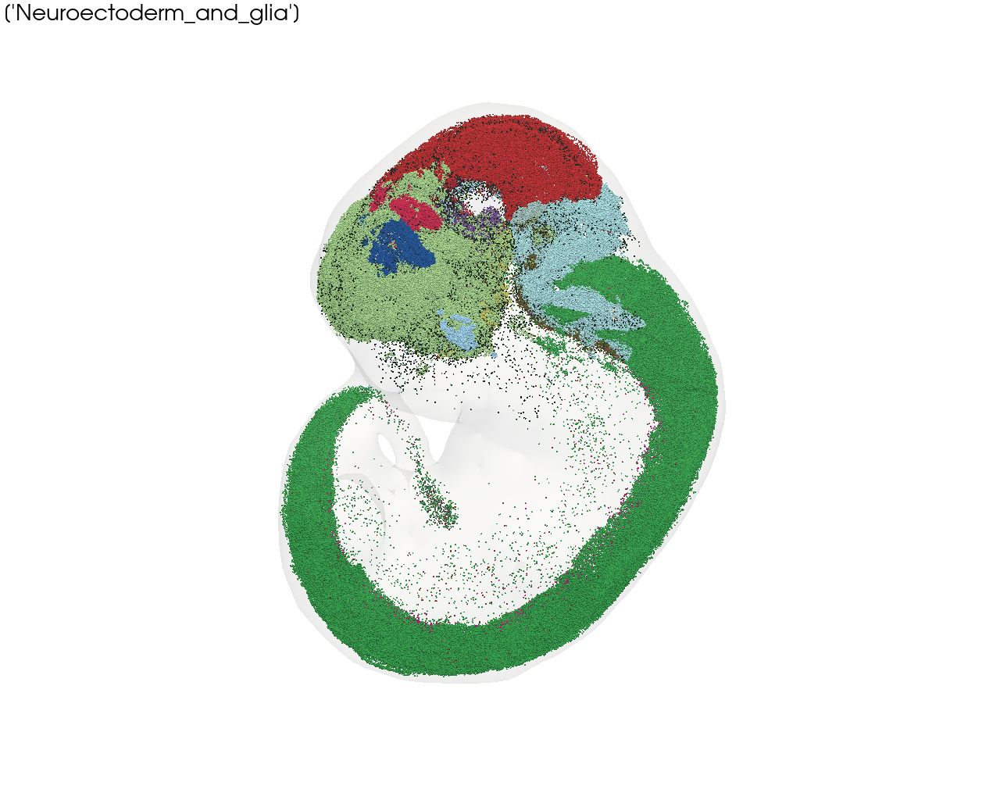

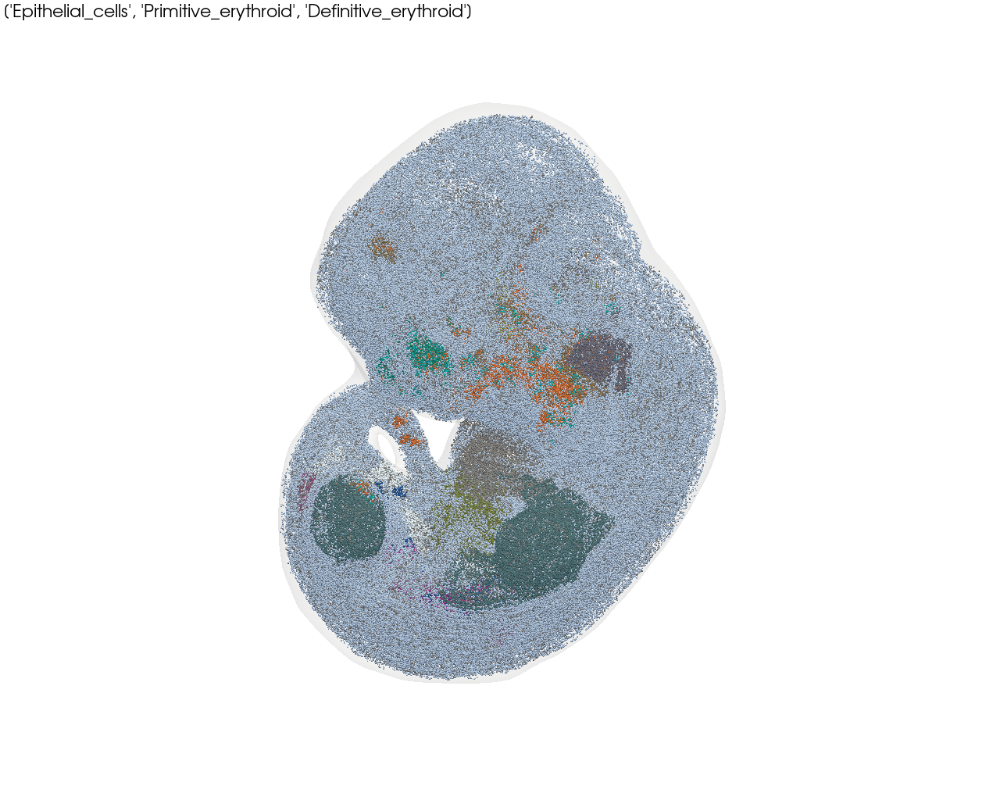

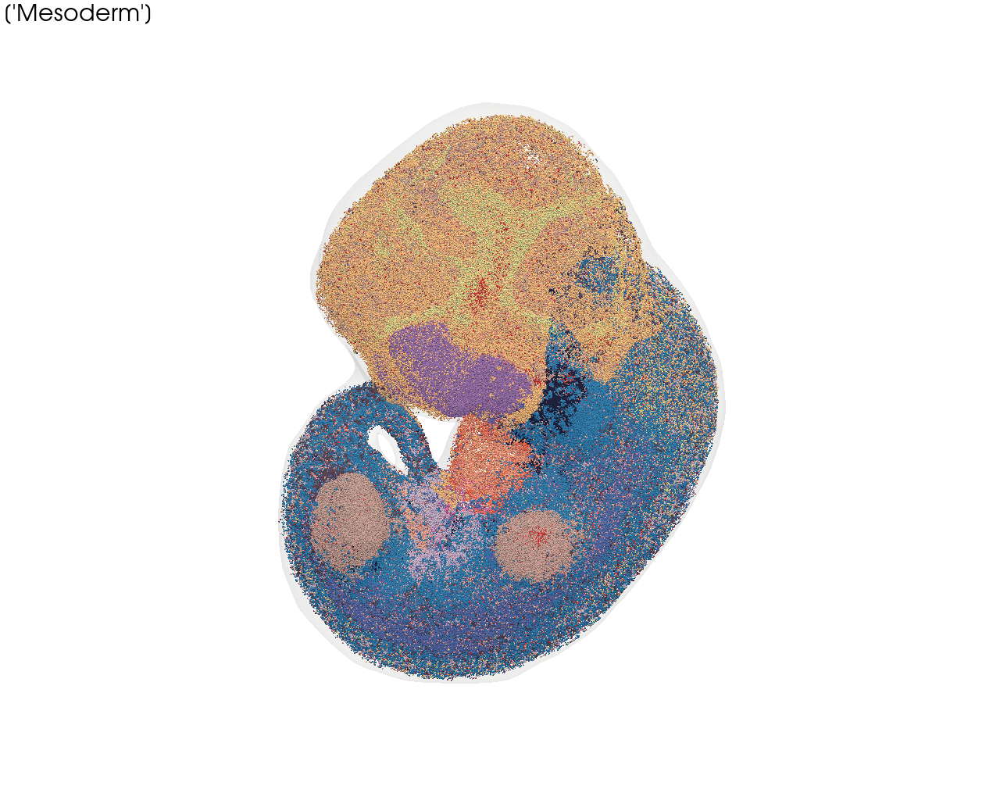

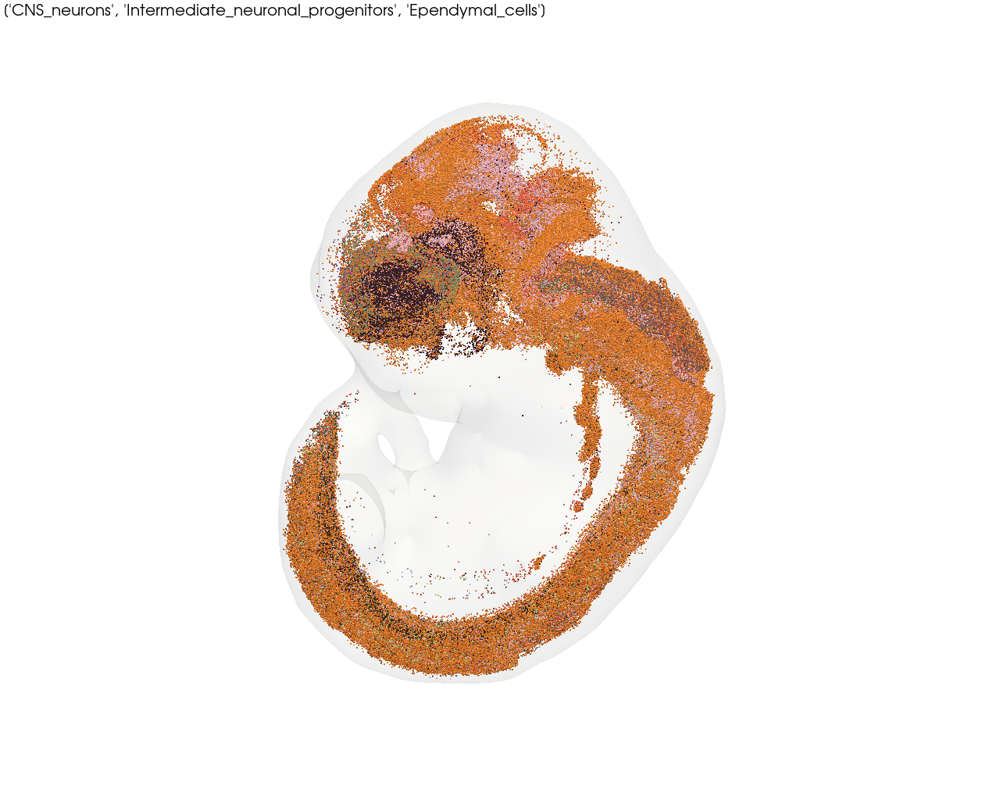

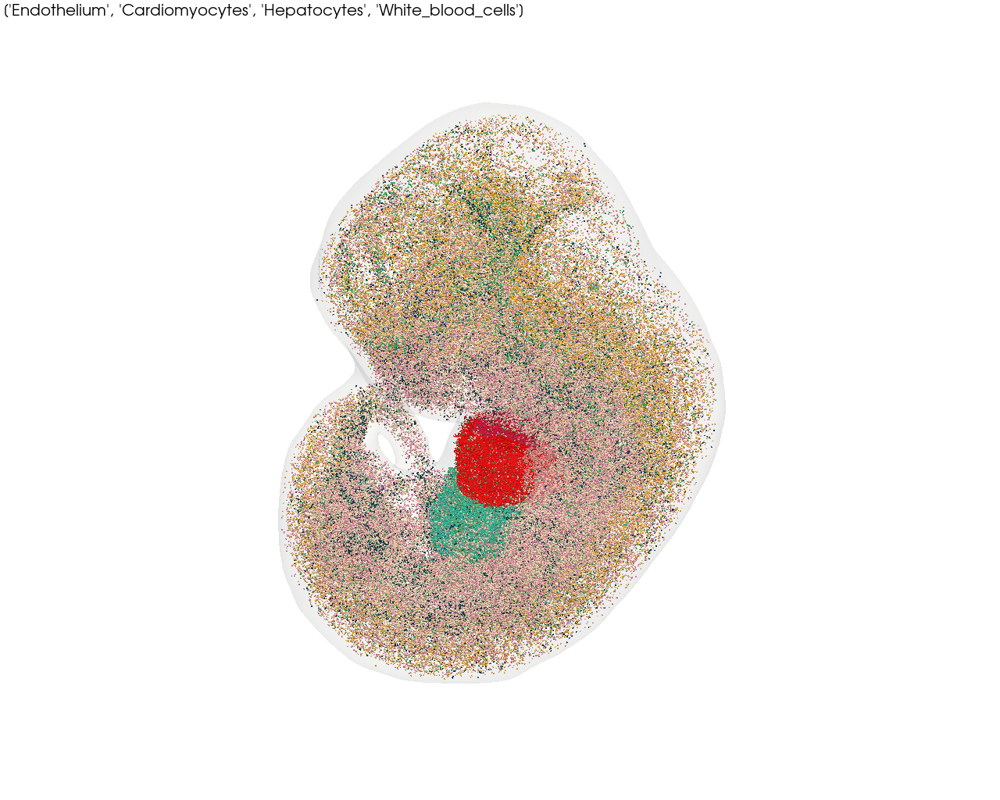

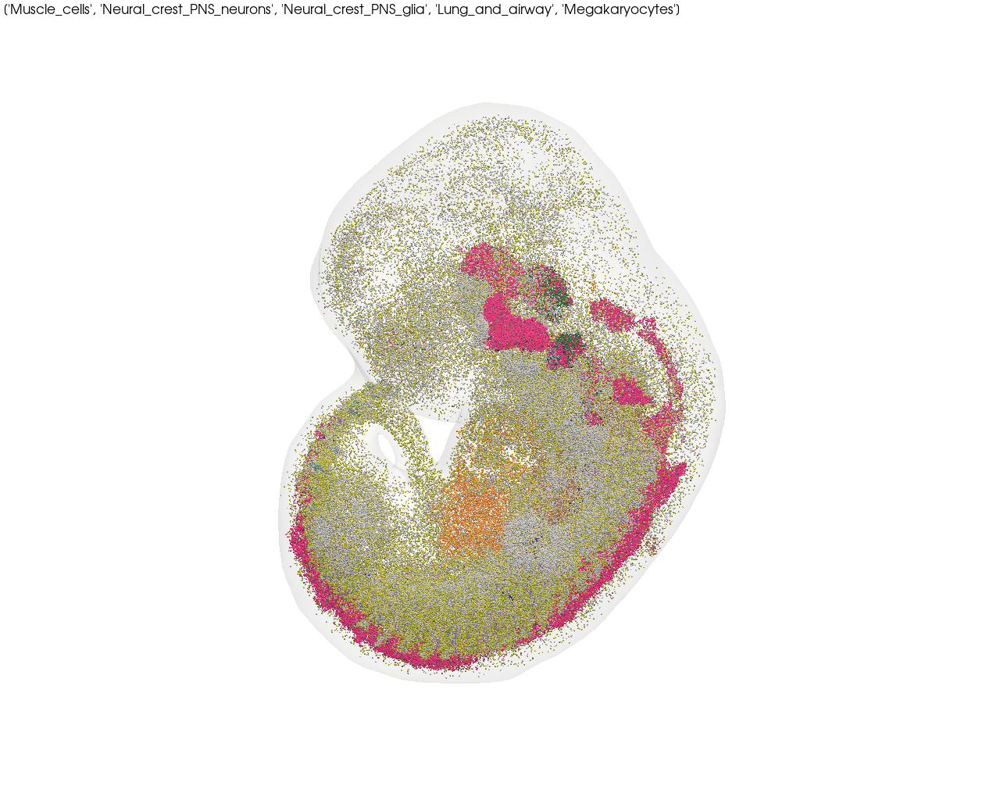

In [11]:
E115_cgs_dict = {
    'sub1': ['Neuroectoderm_and_glia'], 
    'sub2': ['Epithelial_cells', 'Primitive_erythroid', 'Definitive_erythroid'],
    'sub3': ['Mesoderm'],
    'sub4': ['CNS_neurons', 'Intermediate_neuronal_progenitors', 'Ependymal_cells'],
    'sub5': ['Endothelium', 'Cardiomyocytes', 'Hepatocytes', 'White_blood_cells'],
    'sub6': ['Muscle_cells', 'Neural_crest_PNS_neurons', 'Neural_crest_PNS_glia', 'Lung_and_airway', 'Megakaryocytes'] 
}
for key, sub_groups in E115_cgs_dict.items():
    sub_E115_st_cell_data = E115_st_cell_data.loc[E115_st_cell_data['sc_ref_groups'].isin(sub_groups)]
    sub_E115_pc = E115_pc.extract_points(np.isin(np.asarray(E115_pc.point_data['mapped_celltype']), sub_E115_st_cell_data['mapped_celltype'].tolist()))
    
    import pyvista as pv
    pv.global_theme.transparent_background = False
    _ = st.pl.three_d_plot(
            model=st.tdr.collect_models([sub_E115_pc, E115_mesh]),
            key='mapped_celltype',
            model_style=["points", "surface"],
            model_size=2,
            opacity=[1, 0.1],
            colormap=None,
            text=f'{sub_groups}',
            show_legend=False,
            show_axes=False,
            jupyter="static",
            cpo="xy",
            window_size=(1280, 1024),
        )

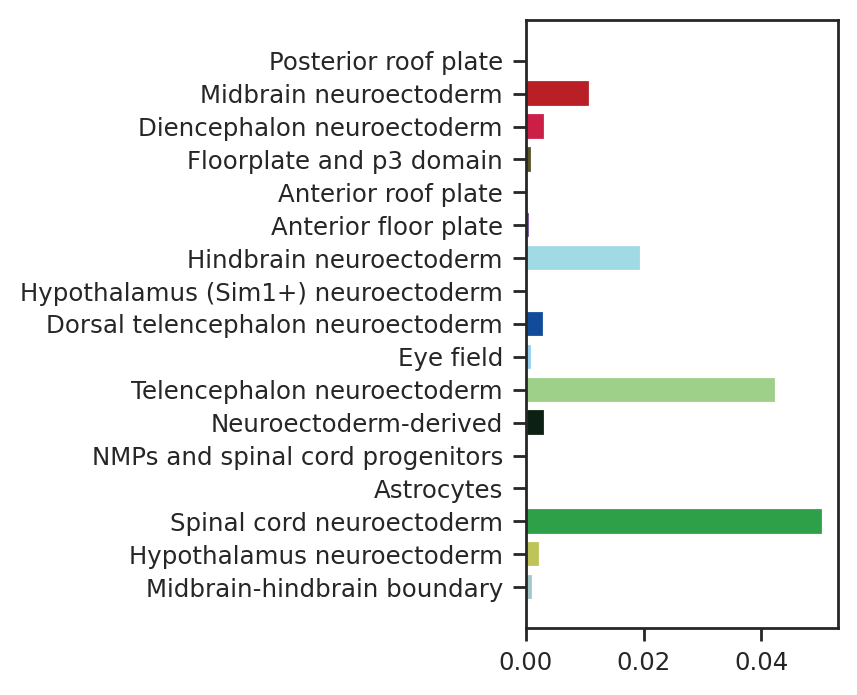

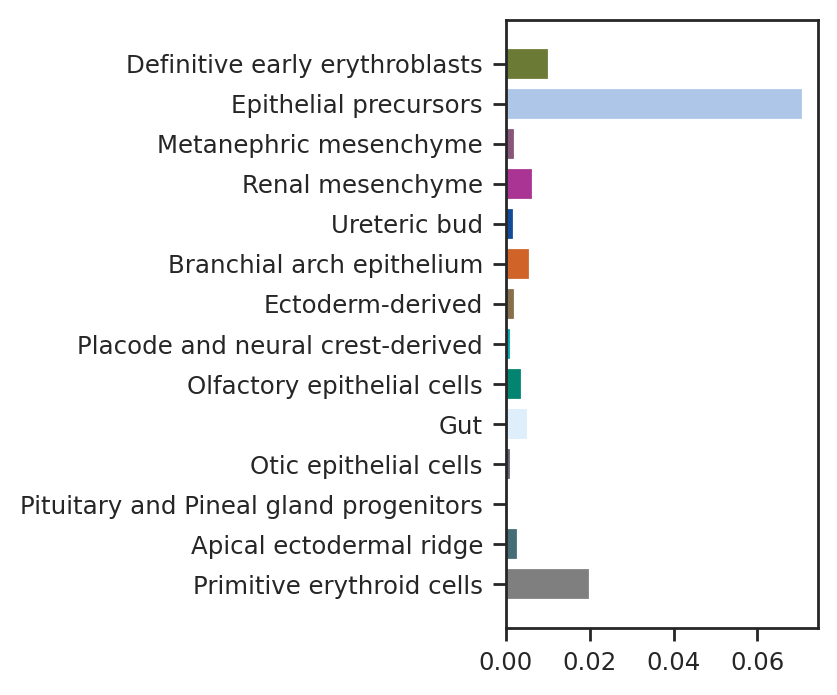

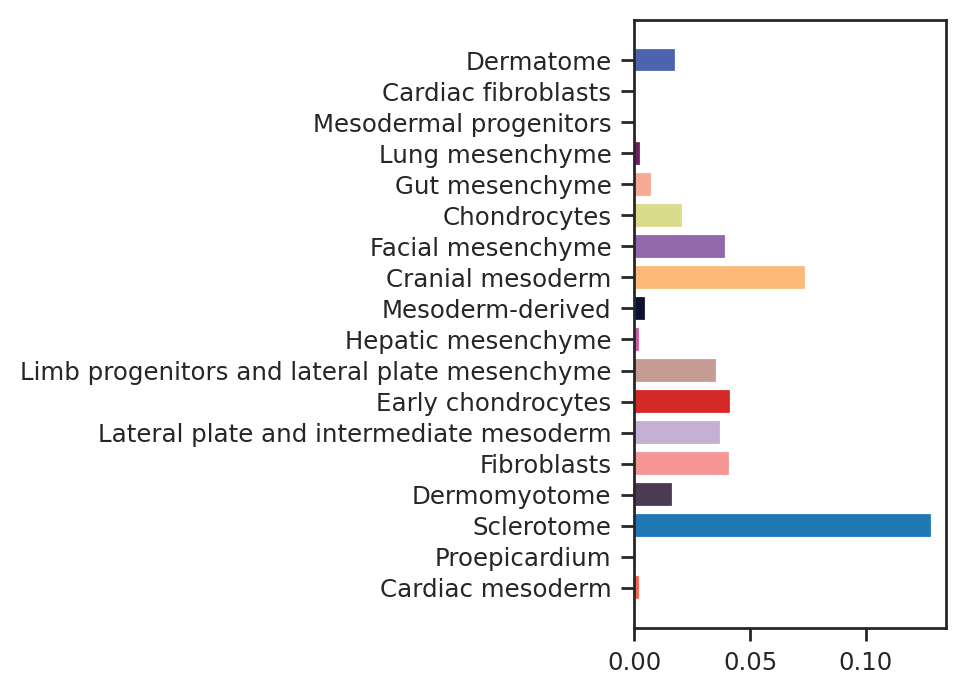

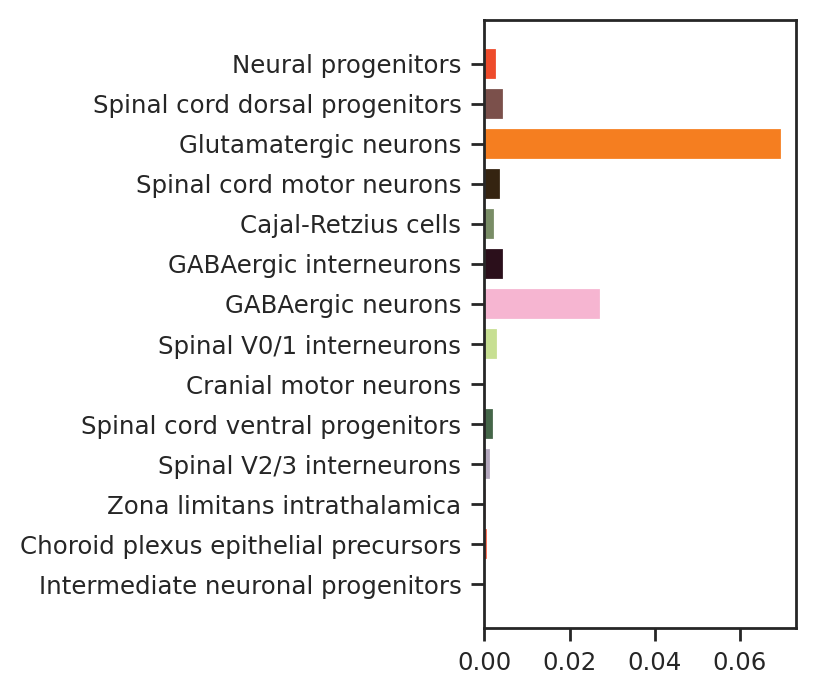

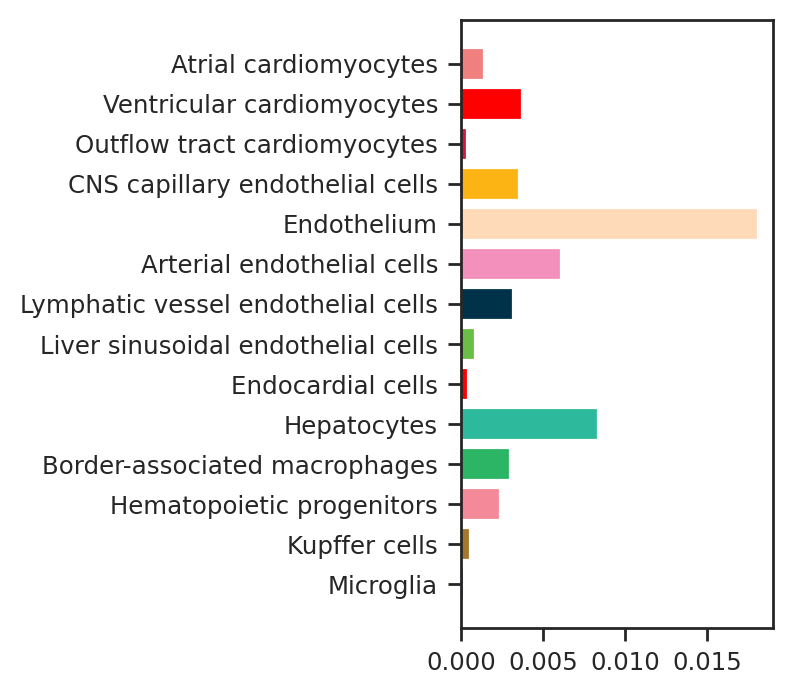

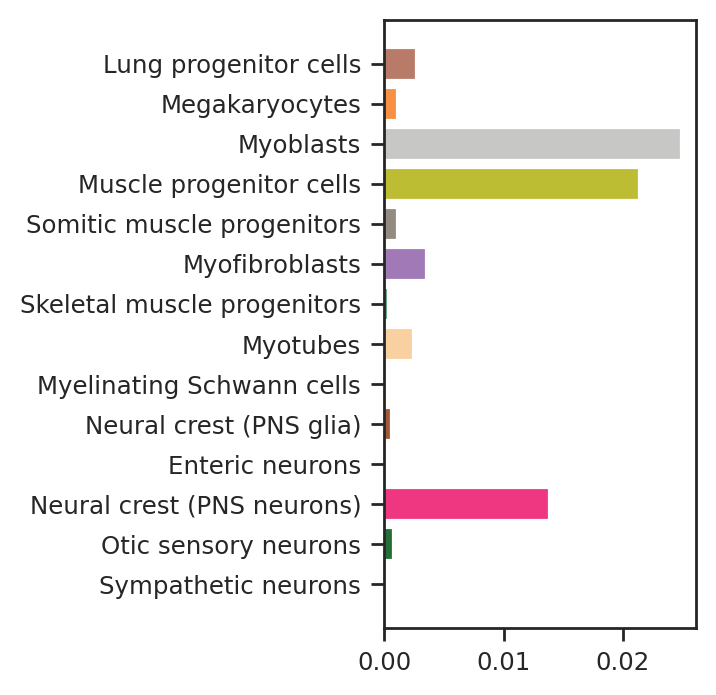

In [12]:
for key, sub_groups in E115_cgs_dict.items():
    sub_st_cell_data = E115_st_cell_data.loc[E115_st_cell_data['sc_ref_groups'].isin(sub_groups)]
    sub_st_cell_data.sort_values(by=['sc_ref_groups'], inplace=True)
    sub_st_celltypes = sub_st_cell_data['mapped_celltype'].tolist()
    sub_st_celltypes.reverse()
    
    sub_adata = E115_adata[E115_adata.obs['mapped_celltype'].isin(sub_st_celltypes), :].copy()
    sub_data = pd.DataFrame(sub_adata.obs['mapped_celltype'].value_counts() / E115_adata.shape[0]).loc[sub_st_celltypes, :]
    sub_data.columns = ["fraction"]
    sub_data["celltypes"] = sub_data.index
    
    fig, ax = plt.subplots(1, 1, figsize=(2, 4))
    ax.barh(sub_data["celltypes"], sub_data["fraction"], label=sub_data["celltypes"], color=[available_cts_colors_E115[ct] for ct in sub_data["celltypes"]])
    fig.show()